In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fashion-product-images-dataset/fashion-dataset/images.csv
/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/31973.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/30778.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/19812.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/22735.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/38246.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/16916.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/52876.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/39500.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/44758.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/59454.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/44951.jp

In [2]:
import numpy as np
import pandas as pd
import os
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import matplotlib.pyplot as plt
import seaborn as sns

 

plt.rcParams['font.size'] = 16

In [3]:
path = "/kaggle/input/fashion-product-images-dataset/fashion-dataset/images"
images_df = pd.read_csv("/kaggle/input/fashion-product-images-dataset/fashion-dataset/images.csv")
styles_df = pd.read_csv("/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv", on_bad_lines ='skip')

In [4]:
images_df.head()

,filename,link
0,15970.jpg,http://assets.myntassets.com/v1/images/style/p...
1,39386.jpg,http://assets.myntassets.com/v1/images/style/p...
2,59263.jpg,http://assets.myntassets.com/v1/images/style/p...
3,21379.jpg,http://assets.myntassets.com/v1/images/style/p...
4,53759.jpg,http://assets.myntassets.com/v1/images/style/p...


In [5]:
styles_df.head()

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt


In [6]:
styles_df['filename'] = styles_df['id'].astype('str')+'.jpg'
styles_df.head()

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,filename
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt,15970.jpg
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans,39386.jpg
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch,59263.jpg
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants,21379.jpg
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt,53759.jpg


In [7]:
image_files = os.listdir(path)

In [8]:
styles_df['present'] = styles_df['filename'].apply(lambda x: x in image_files)
styles_df = styles_df[styles_df['present']].reset_index(drop=True)
styles_df

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,filename,present
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt,15970.jpg,True
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans,39386.jpg,True
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch,59263.jpg,True
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants,21379.jpg,True
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt,53759.jpg,True
...,...,...,...,...,...,...,...,...,...,...,...,...
44414,17036,Men,Footwear,Shoes,Casual Shoes,White,Summer,2013.0,Casual,Gas Men Caddy Casual Shoe,17036.jpg,True
44415,6461,Men,Footwear,Flip Flops,Flip Flops,Red,Summer,2011.0,Casual,Lotto Men's Soccer Track Flip Flop,6461.jpg,True
44416,18842,Men,Apparel,Topwear,Tshirts,Blue,Fall,2011.0,Casual,Puma Men Graphic Stellar Blue Tshirt,18842.jpg,True
44417,46694,Women,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017.0,Casual,Rasasi Women Blue Lady Perfume,46694.jpg,True


In [9]:
styles_df = styles_df.sample(10000)
styles_df

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,filename,present
6019,1943,Unisex,Accessories,Bags,Duffel Bag,Grey,Summer,2011.0,Casual,Domyos Grey Duffle Duffle Bag,1943.jpg,True
7618,59773,Women,Accessories,Jewellery,Jewellery Set,Gold,Winter,2015.0,Casual,Estelle Women Gold Jewellery Set,59773.jpg,True
27879,18971,Women,Apparel,Topwear,Tops,Black,Summer,2011.0,Casual,United Colors of Benetton Women Solid Black Top,18971.jpg,True
10955,2558,Women,Apparel,Bottomwear,Track Pants,Black,Summer,2011.0,Casual,Domyos Women Trompette Track Pant,2558.jpg,True
545,52647,Women,Accessories,Bags,Handbags,Black,Summer,2012.0,Casual,Mod'acc Women Black Handbag,52647.jpg,True
...,...,...,...,...,...,...,...,...,...,...,...,...
12713,46729,Women,Personal Care,Fragrance,Perfume and Body Mist,White,Spring,2017.0,Casual,Rasasi Women Cherish Perfume,46729.jpg,True
9018,24976,Women,Apparel,Topwear,Tops,Peach,Summer,2012.0,Casual,United Colors of Benetton Women Peach Top,24976.jpg,True
10156,6592,Women,Apparel,Topwear,Tshirts,Grey,Summer,2011.0,Casual,Spykar Women's World Sweet Things White T-shirt,6592.jpg,True
16475,5155,Women,Apparel,Topwear,Tshirts,Yellow,Summer,2011.0,Casual,Wrangler Women's Lip Print Yellow T-shirt,5155.jpg,True


In [10]:
img_size = 224
datagen = ImageDataGenerator(rescale=1./255)
generator = datagen.flow_from_dataframe(dataframe = styles_df,directory = path,target_size=(img_size,img_size),x_col = 'filename',class_mode = None,batch_size = 32,shuffle = False,classes = None)

Found 10000 validated image filenames.


In [11]:
base_model = VGG16(include_top = False, input_shape = (img_size, img_size,3))
for layer in base_model.layers:
    layer.trainable = False

input_layer = Input(shape=(img_size,img_size,3))
x = base_model(input_layer)
output = GlobalAveragePooling2D()(x)

embeddings = Model(inputs=input_layer, outputs=output)
embeddings.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
Total params: 14,714,688
Trainable params: 0
Non-trainable params: 14,714,688
_________________________________________________________________


In [12]:
X = embeddings.predict(generator, verbose=1)

313/313 [==============================] - 2796s 9s/step


In [13]:
from sklearn.decomposition import PCA

In [14]:
pca = PCA(2)
X_pca = pca.fit_transform(X)

In [15]:
styles_df[['pc1','pc2']]=X_pca

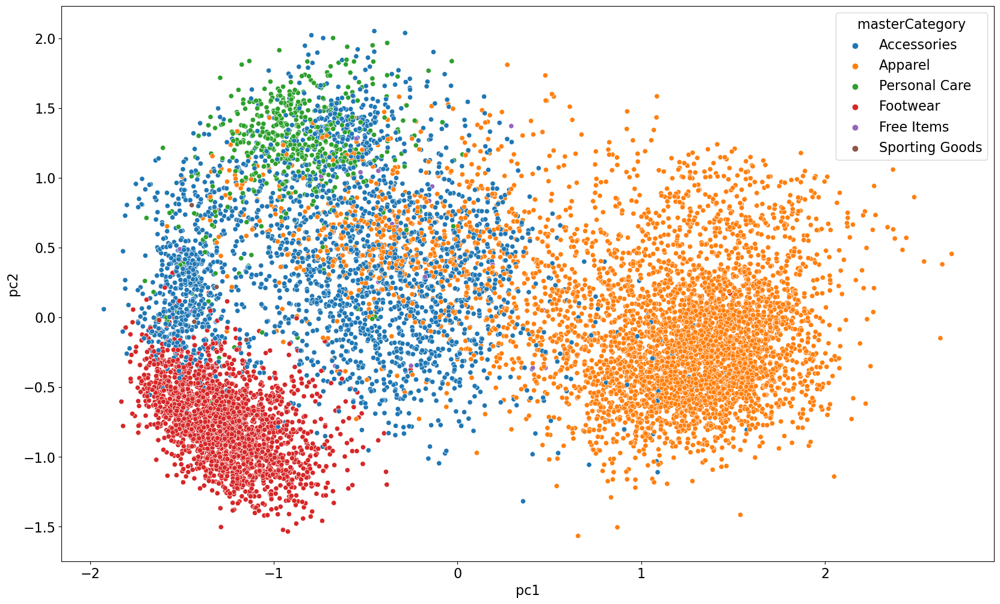

In [16]:
plt.figure(figsize=(20,12))
sns.scatterplot(x='pc1',y='pc2',data=styles_df, hue='masterCategory')
plt.show()

In [17]:
def read_img(image_path):
    image = load_img(os.path.join(path,image_path),target_size=(img_size,img_size,3))
    image = img_to_array(image)
    image = image/255.
    return image

In [18]:
styles_df = styles_df.reset_index(drop=True)

In [19]:
import random 
from sklearn.neighbors import KNeighborsClassifier

In [20]:
y = styles_df['id']
nearest_neighbours = KNeighborsClassifier(n_neighbors=21)
nearest_neighbours.fit(X,y)

KNeighborsClassifier(n_neighbors=21)

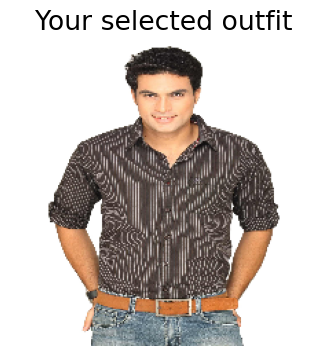

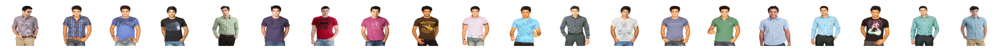

In [21]:
for _ in range(1):
    i = random.randint(0,len(styles_df))
    img1 = read_img(styles_df.loc[i,'filename'])
    dist, index = nearest_neighbours.kneighbors(X=X[i,:].reshape(1,-1))
    plt.figure(figsize = (4 , 4))
    plt.imshow(img1)
    plt.title("Your selected outfit")
    plt.axis('off')
    plt.figure(figsize = (25 ,25))
   
    for i in range(1,21):
        plt.subplot(20 , 20, i)
        plt.subplots_adjust(hspace = 0.1 , wspace = 0.2)
        image = read_img(styles_df.loc[index[0][i],'filename'])
        plt.imshow(image)
        plt.axis('off')

In [ ]:
#In Page Selected Dresses
selected_img_features = data1[0] 
similarities = []
for features in dataset_features:
    sim = cosine_similarity(selected_img_features, features)
    similarities.append(sim)


indices = np.argsort(similarities)[::-1] 
N = 5 
recommended_images = [dataset[i] for i in indices[:N]]
print(recommended_images)